In [116]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [117]:
from hexstar import HStarProblem, HStarSearch, h_cost_travel_time, travel_time, hex_manhattan_distance, f_cost, construct_full_solution, radius_from_angle, next_velocity
from hexgrid import (HexCoord, build_obstacle_map, HexGrid, Node, get_direction, 
    VelocityState, get_neighbors_at_radius, get_available_nodes_in_dir, get_direction_ray, 
    hex_segment_between, hdist, angle_abc, image_to_hex_obstacles, 
    unique_direction_vectors_up_to_n, circular_slice, make_grid_with_obstacles, euclid_center_distance, axial_to_xy)
from hexplot import plot_hex_grid, plot_hex_grid_fast, plot_hex_grid_2
from typing import Iterable, Optional, Set, List, Tuple, Callable, Dict, Literal
import math
import time

In [118]:
RADIUS = 100
MAP_JPG_SIZE = 1000 # largest dimension in px
a_max = 2
a_min = 89
ay_window_ms = 10

collision_radius = 2

jps_horizon = 1
n_step = 2

In [119]:
# hex_size = MAP_JPG_SIZE/RADIUS
# obs, start, goal = image_to_hex_obstacles(
#     "map3.png",
#     hex_radius_px=hex_size,
#     black_threshold=20
# )
# goal = HexCoord(-20, 90)

In [120]:
# hex_size = MAP_JPG_SIZE/RADIUS
# obs, start, goal = image_to_hex_obstacles(
#     "map2.png",
#     hex_radius_px=hex_size,
#     black_threshold=20
# )

In [121]:
# hex_size = 250/RADIUS
# obs, start, goal = image_to_hex_obstacles(
#     "map.png",
#     hex_radius_px=hex_size,
#     black_threshold=20
# )

In [122]:
obs_density = 0.03
hex_size = 1
n_obs = int(obs_density * 3 * RADIUS * (RADIUS + 1))
start = HexCoord(q=-RADIUS + 4, r=RADIUS - 8)
#start = HexCoord(0,0)
goal = HexCoord(q=RADIUS - 4, r=-RADIUS + 4)

obs = build_obstacle_map(
    center = HexCoord(0,0),
    radius = RADIUS,
    types = [("random_n", {"n": n_obs})],
    exclude=[start, goal],
    seed=42
)

# Draw the outer boundary
obs = set(obs.keys()).union(get_neighbors_at_radius(HexCoord(0,0), RADIUS))

In [8]:


hg = HexGrid(hex_size, obs)

problem = HStarProblem(
    hg, # hex grid
    start,
    goal,
    a_max,  # maximum acceleration (for acceleration phase)
    a_min,  # maximum deceleration (positive value; used with sign as needed)
    collision_radius = collision_radius,
    jps_horizon =  jps_horizon,
    ay_window_ms = 0,#ay_window_ms,
    n_step = n_step,   
    #start_v = VelocityState(0, None),
    goal_v = VelocityState(0, None)
)
#problem.goal_v=VelocityState(0, problem.DIRECTIONS.index(HexCoord(-1,2))) # approach from the northeast
hs = HStarSearch(
    problem = problem,
    heuristic = h_cost_travel_time
)


<Axes: title={'center': 'Hex grid (radius=100) centered at (0,0)  Run 1 REVERSE'}, xlabel='x', ylabel='y'>

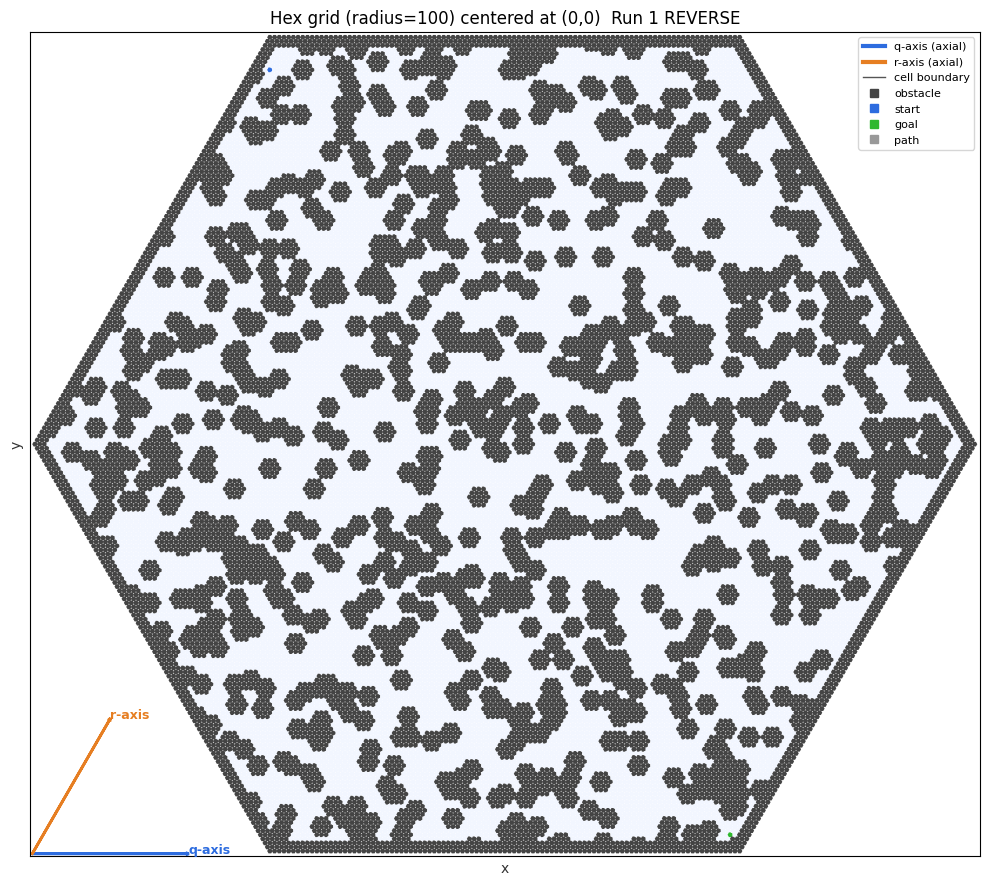

In [9]:
plot_hex_grid_fast(
    hg.obstacles.union(problem.collision_radius_map),
    start,
    HexCoord(0,0),
    RADIUS,
    goal = goal,
    figsize=(10,10),
    show_coords = False,
    #path = hexes_in_between_solid(HexCoord(q=0, r=0), HexCoord(q=14, r=10)),
    #path=problem.get_available_hexes_in_dir(start, problem.DIRECTIONS[0], ray_range = 50),
    #path=problem.actions(hs.root),
    #path=set(unique_direction_vectors_up_to_n(HexCoord(0,0), RADIUS)),
    facecolor_path = "#999999",
    #path = set([n.location for n in fsolution[-24:-21]]),
    #path = fsolution,
    linewidth=0,
    plt_title = f" Run {1} REVERSE",
    save_path=f"n-step-actions-jps",
)

In [10]:
start = time.time()
fsolution = hs.search()
fsolution_path = construct_full_solution(fsolution)
search_time = time.time() - start
print(f'Search time: {search_time:.2f}s')

Search time: 0.74s


<Axes: title={'center': 'Hex grid (radius=100) centered at (0,0) Solution'}, xlabel='x', ylabel='y'>

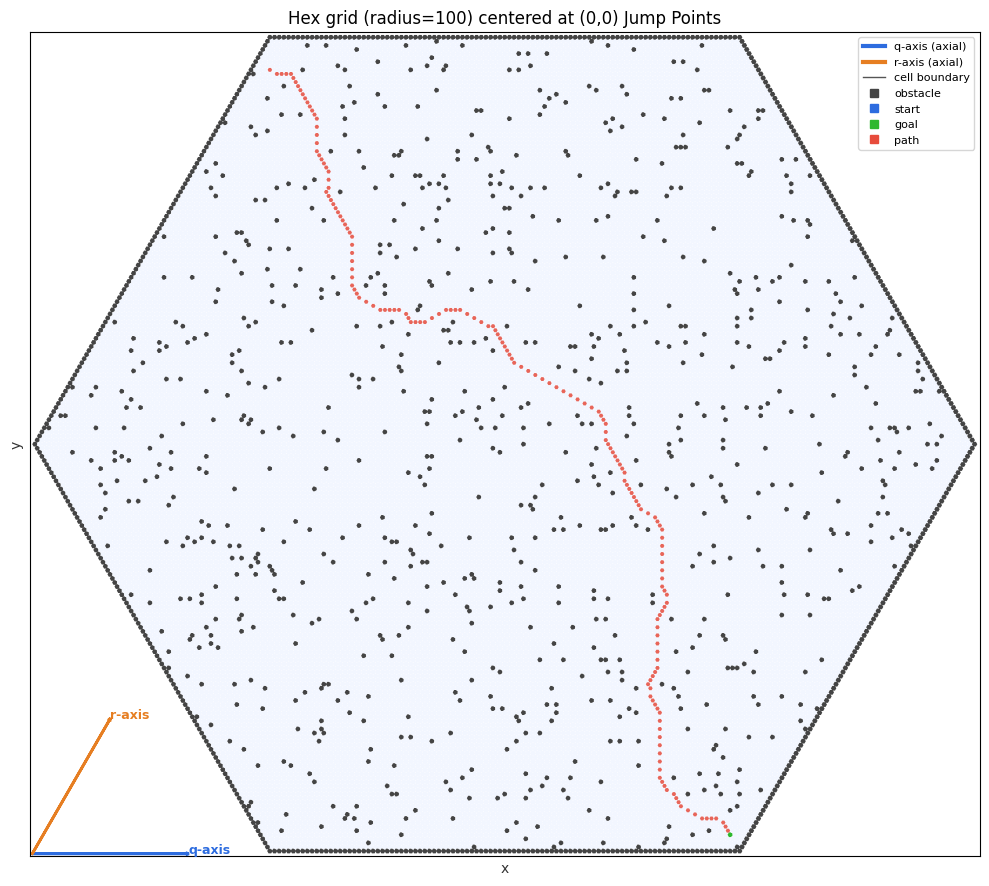

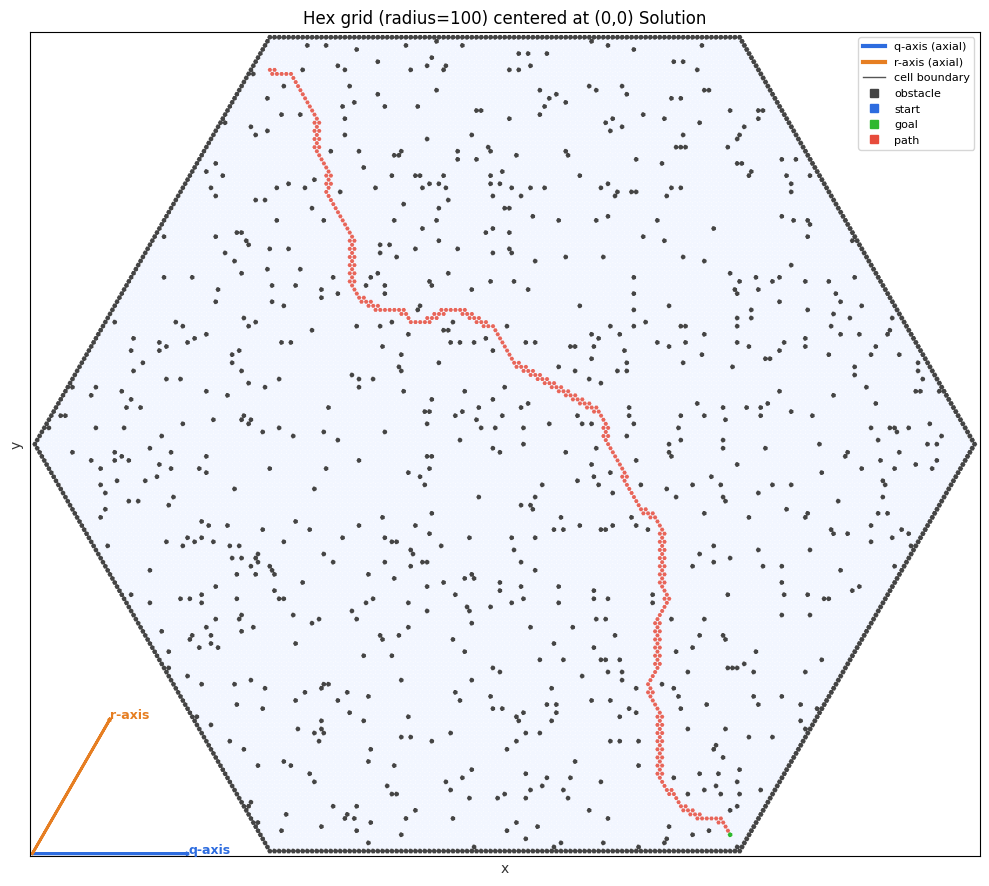

In [11]:
plot_hex_grid_fast(
    obs,
    start,
    HexCoord(0,0),
    RADIUS,
    goal = goal,
    figsize=(10,10),
    show_coords = False,
    path = set([n.location for n in fsolution]),
    linewidth=0,
    plt_title = f"Jump Points",
    save_path=f"jump-points-turning-r",
)
plot_hex_grid_fast(
    obs,
    start,
    HexCoord(0,0),
    RADIUS,
    goal = goal,
    figsize=(10,10),
    show_coords = False,
    path = fsolution_path,
    linewidth=0,
    plt_title = f"Solution",
    save_path=f"solution-turning-r",
)

In [12]:
abc = {1,2,3}
defg = {6}
defg.union({1,2,3,4,5} - abc)

{4, 5, 6}

<Axes: title={'center': 'Hex grid (radius=100) centered at (0,0) Expand Counter'}, xlabel='x', ylabel='y'>

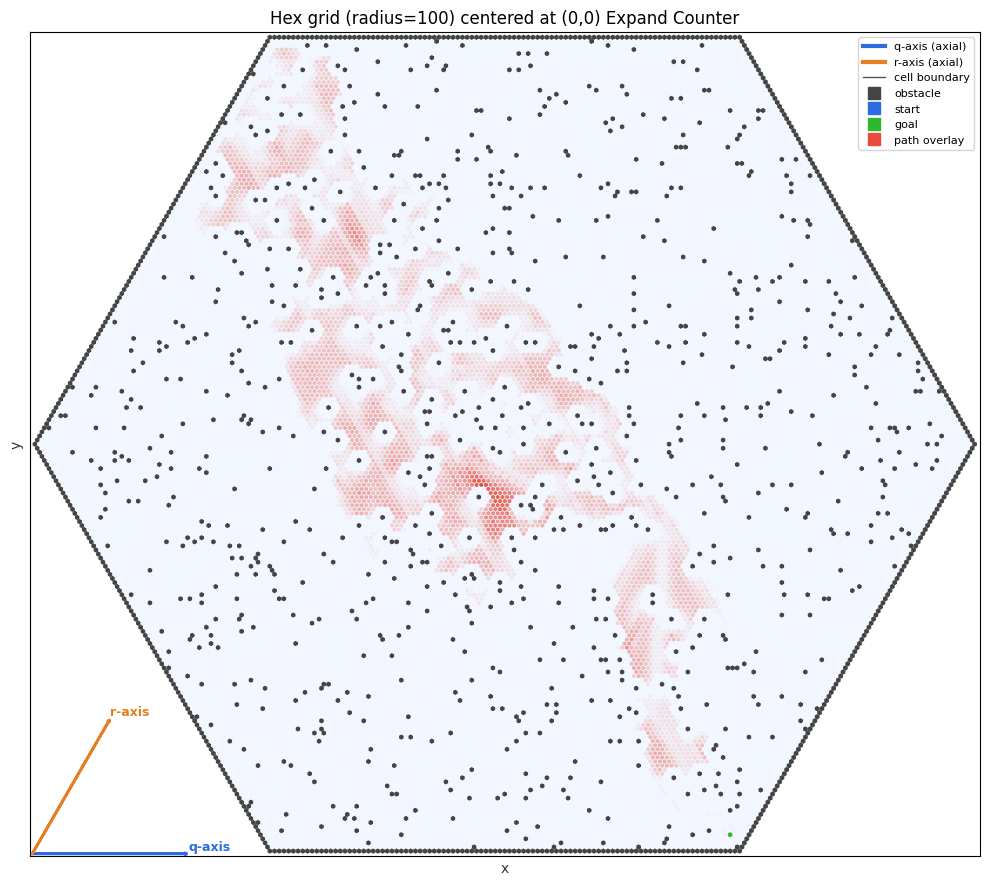

In [13]:
plot_hex_grid_2(
    obs,
    start,
    HexCoord(0,0),
    RADIUS,
    goal = goal,
    figsize=(10,10),
    show_coords = False,
    path = problem.expand_counter,
    linewidth=0,
    plt_title = f"Expand Counter",
    save_path=f"expand-counter",
)

In [14]:
def print_directions_info():
    for i in range(len(problem.DIRECTIONS_INFO)):
        direction = problem.DIRECTIONS[i]
        info = problem.DIRECTIONS_INFO[direction]
        print(f'====================================')
        print(f'Index: {i}')
        print(f'Direction: {direction}')
        print(f'Transition unit distance: {info.s}')
        print(f'Blockers: {info.blockers}')
    print(f'====================================')

#def print_directions_info():


In [15]:
[f.velocity.magnitude for f in fsolution]

[0,
 3.4641016151377544,
 4.350655494322149,
 5.084919513674825,
 5.72578463538636,
 6.30181028920278,
 6.829422827104611,
 7.319099629165669,
 7.778008910507145,
 8.211310847983047,
 8.622866638913045,
 9.015654846030602,
 9.392030426538799,
 9.753893518144746,
 10.102803669951308,
 10.440059636987575,
 10.999765689497988,
 11.532339104616076,
 12.041380536460805,
 12.52975838649162,
 12.803243669247749,
 13.07100805922818,
 13.33339622581897,
 13.59071955949938,
 13.843260503769859,
 14.270103761894465,
 14.684544983595323,
 14.91858118607497,
 15.14900220594695,
 15.3759705731398,
 15.599636992453913,
 15.820141514114596,
 16.03761455943145,
 16.252177822900016,
 16.463945068465172,
 16.673022834738582,
 16.87951106157965,
 17.08350364849861,
 17.285088953735265,
 17.6287917946336,
 17.96592052021106,
 18.296838528514723,
 18.621876923085406,
 18.941338393538636,
 19.255500516437916,
 19.43456980148561,
 19.61200414539758,
 19.787847528959976,
 20.088775717533593,
 20.38526207409086

In [16]:
def print_velocities(path):
    for n in path:
        print(f'Velocity: {n.velocity.magnitude}, Position: {n.location}')

In [17]:
print_velocities(fsolution)

Velocity: 0, Position: HexCoord(q=-96, r=92)
Velocity: 3.4641016151377544, Position: HexCoord(q=-94, r=91)
Velocity: 4.350655494322149, Position: HexCoord(q=-93, r=91)
Velocity: 5.084919513674825, Position: HexCoord(q=-92, r=91)
Velocity: 5.72578463538636, Position: HexCoord(q=-91, r=91)
Velocity: 6.30181028920278, Position: HexCoord(q=-90, r=90)
Velocity: 6.829422827104611, Position: HexCoord(q=-89, r=89)
Velocity: 7.319099629165669, Position: HexCoord(q=-88, r=88)
Velocity: 7.778008910507145, Position: HexCoord(q=-87, r=87)
Velocity: 8.211310847983047, Position: HexCoord(q=-86, r=86)
Velocity: 8.622866638913045, Position: HexCoord(q=-85, r=85)
Velocity: 9.015654846030602, Position: HexCoord(q=-84, r=84)
Velocity: 9.392030426538799, Position: HexCoord(q=-83, r=83)
Velocity: 9.753893518144746, Position: HexCoord(q=-82, r=82)
Velocity: 10.102803669951308, Position: HexCoord(q=-81, r=81)
Velocity: 10.440059636987575, Position: HexCoord(q=-80, r=80)
Velocity: 10.999765689497988, Position:

In [18]:
from typing import Sequence, Tuple, List

def velocity_profile_xy(path: Sequence) -> Tuple[List[float], List[float], List[int]]:
    """
    Returns:
      x_cum: cumulative hex distance traveled (same length as path)
      vels : velocity magnitudes (same length as path)
      segd : per-segment hex distances between consecutive points (len = len(path)-1)
    """
    if not path:
        return [], [], []

    vels = [n.velocity.magnitude for n in path]

    x_cum = [0.0]
    segd = []
    total = 0

    for prev, nxt in zip(path[:-1], path[1:]):
        d = hex_manhattan_distance(prev.location, nxt.location)
        segd.append(d)
        total += d
        x_cum.append(float(total))

    return x_cum, vels, segd

In [19]:
import matplotlib.pyplot as plt

def plot_velocity_profile(
    path,
    ax=None,
    marker="o",
    lw=2.0,
    color="#1f77b4",
    title="Velocity vs Path Distance",
    show=True,
    savepath=None,          # <-- NEW: e.g. "vel_profile.png" or Path(...)
    dpi=150,                # <-- NEW: file resolution
    bbox_inches="tight",    # <-- NEW: trims whitespace in saved image
    close=False             # <-- NEW: close figure after saving/showing (useful in batch)
):
    x, v, segd = velocity_profile_xy(path)

    fig = None
    if ax is None:
        fig, ax = plt.subplots(figsize=(9, 3.5))
    else:
        fig = ax.figure

    ax.plot(x, v, marker=marker, lw=lw, color=color)
    ax.set_xlabel("Cumulative hex distance traveled (steps)")
    ax.set_ylabel("Velocity")
    ax.set_title(title)
    ax.grid(True, alpha=0.25)

    # Optional: annotate segment distances (can be noisy; keep off by default)
    # for i, d in enumerate(segd, start=1):
    #     ax.text(x[i], v[i], str(d), fontsize=8, ha="left", va="bottom")

    # Layout before save/show so both look good
    if fig is not None:
        fig.tight_layout()

    # Optional save
    if savepath:
        fig.savefig(savepath, dpi=dpi, bbox_inches=bbox_inches)

    # Optional show
    if show:
        plt.show()

    # Optional close (handy for loops / notebooks to avoid too many open figures)
    if close and fig is not None:
        plt.close(fig)

    return ax

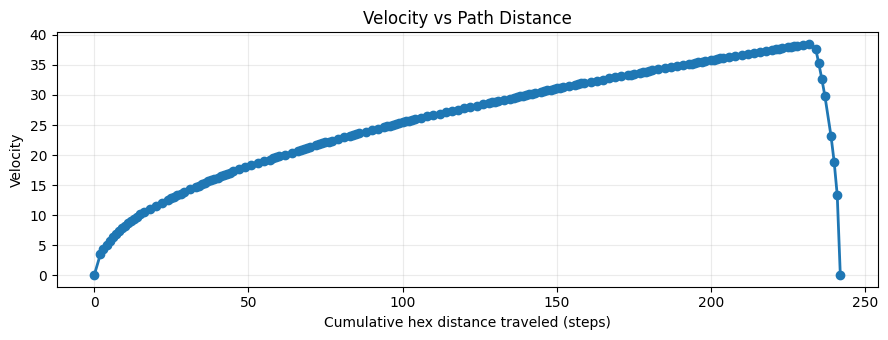

<Axes: title={'center': 'Velocity vs Path Distance'}, xlabel='Cumulative hex distance traveled (steps)', ylabel='Velocity'>

In [20]:
plot_velocity_profile(fsolution, savepath='vel-before.png')

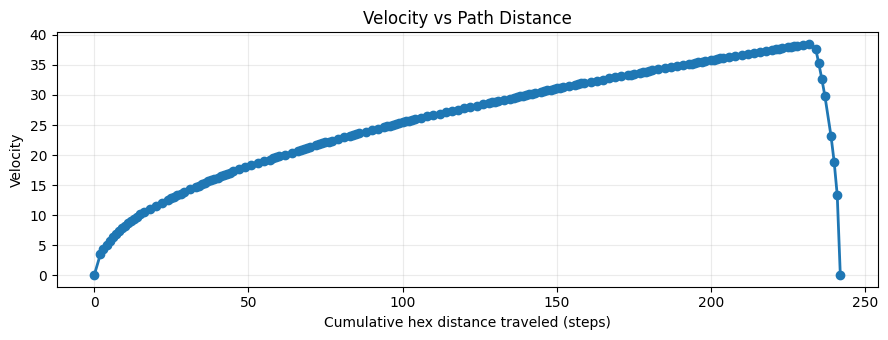

<Axes: title={'center': 'Velocity vs Path Distance'}, xlabel='Cumulative hex distance traveled (steps)', ylabel='Velocity'>

In [21]:
new_path = problem.backtrack(fsolution[-1], 26, 10, transition_function = next_velocity)
new_soln = hs.reconstruct_path(new_path)
plot_velocity_profile(new_soln, savepath='vel-after.png')

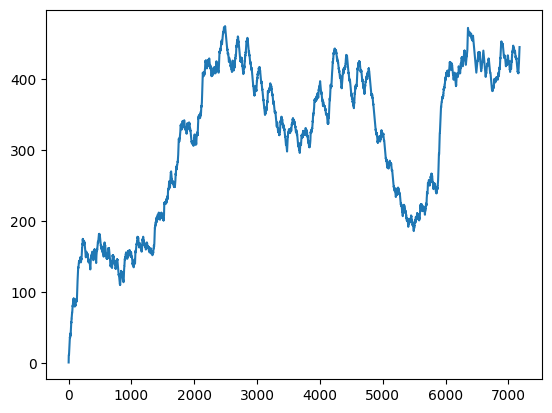

In [22]:
o, c = hs.get_benchmarks()
plt.plot(o)

### Benchmarking

In [23]:
{
    "length": float,          # total Euclidean length
    "turn_sum": float,        # sum of |turn angles|
    "curvature_sum": float,   # sum of |kappa|
    "curvature_sq": float,    # sum of kappa^2
    "max_curvature": float,   # worst local curvature
}

{'length': float,
 'turn_sum': float,
 'curvature_sum': float,
 'curvature_sq': float,
 'max_curvature': float}

In [ ]:
from hexgeometry import *

In [43]:
raw = evaluate_path([f.location for f in fsolution], hex_size=problem.grid.hex_size)
norm = normalize_metrics(raw)
print(f'Raw: {raw}\nNorm: {norm}')

Raw: {'length': 387.13328398716345, 'turn_sum': 25.656340391746813, 'curvature_sum': 11.397249065151822, 'curvature_sq': 3.523809523809522, 'max_curvature': 0.5773502691896264}
Norm: {'length': 387.13328398716345, 'turn_per_length': 0.06627262871202137, 'curv_per_length': 0.029440116715796855, 'curv_sq_per_length': 0.009102316100328807, 'max_curvature': 0.5773502691896264}


In [96]:
def generate_scenarios():
    center = HexCoord(0, 0)

    return [

        # -------------------------
        # OPEN FIELD (no guaranteed corridor)
        # -------------------------
        {
            "name": "sparse_random",
            "center": center,
            "radius": 30,
            "start": HexCoord(-25, 0),
            "goal": HexCoord(25, 0),
            "types": [
                ("random_n", {"n": 250}, "add"),  # ~0.12 density
            ],
        },

        # -------------------------
        # CLUTTERED BUT SOLVABLE
        # -------------------------
        {
            "name": "cluttered_with_bias",
            "center": center,
            "radius": 30,
            "start": HexCoord(-25, -5),
            "goal": HexCoord(25, 5),
            "types": [
                ("random_n", {"n": 300}, "add"),  # ~0.15

                # carve a light corridor after noise
                ("track", {
                    "start": HexCoord(-25, -5),
                    "goal": HexCoord(25, 5),
                    "thickness": 2,
                    "min_turns": 4,
                }, "carve"),
            ],
        },
    ]

In [98]:
scenarios = generate_scenarios()

In [106]:
solution = run_scenario(scenarios[1])
raw = evaluate_path([f.location for f in solution], hex_size=problem.grid.hex_size)
norm = normalize_metrics(raw)
print(f'Raw: {raw}\nNorm: {norm}')

Raw: {'length': 99.28203230275508, 'turn_sum': 0.5235987755982987, 'curvature_sum': 0.010369516947304255, 'curvature_sq': 0.00010752688172043015, 'max_curvature': 0.010369516947304255}
Norm: {'length': 99.28203230275508, 'turn_per_length': 0.005273852311983432, 'curv_per_length': 0.00010444505120204413, 'curv_sq_per_length': 1.0830447285016573e-06, 'max_curvature': 0.010369516947304255}


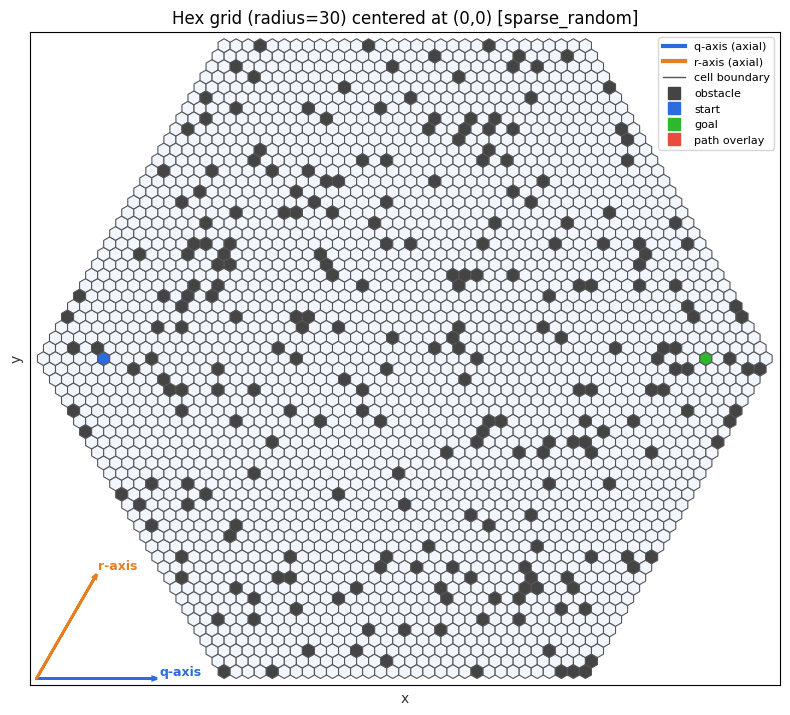

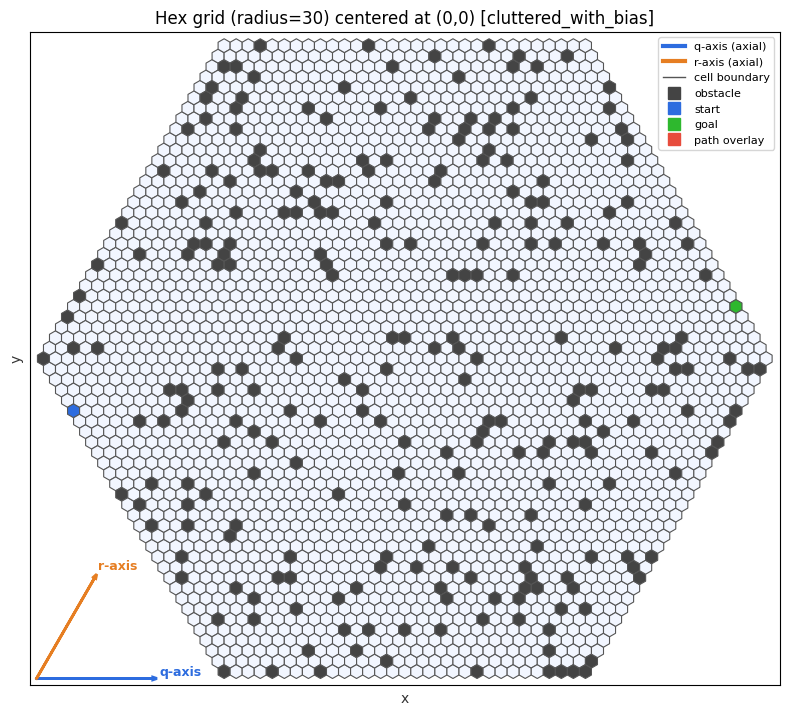

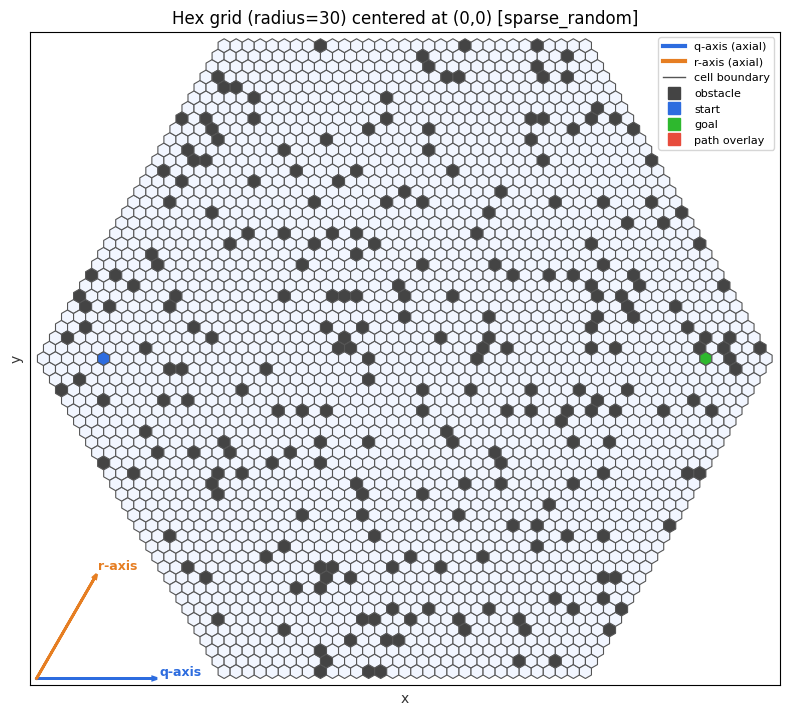

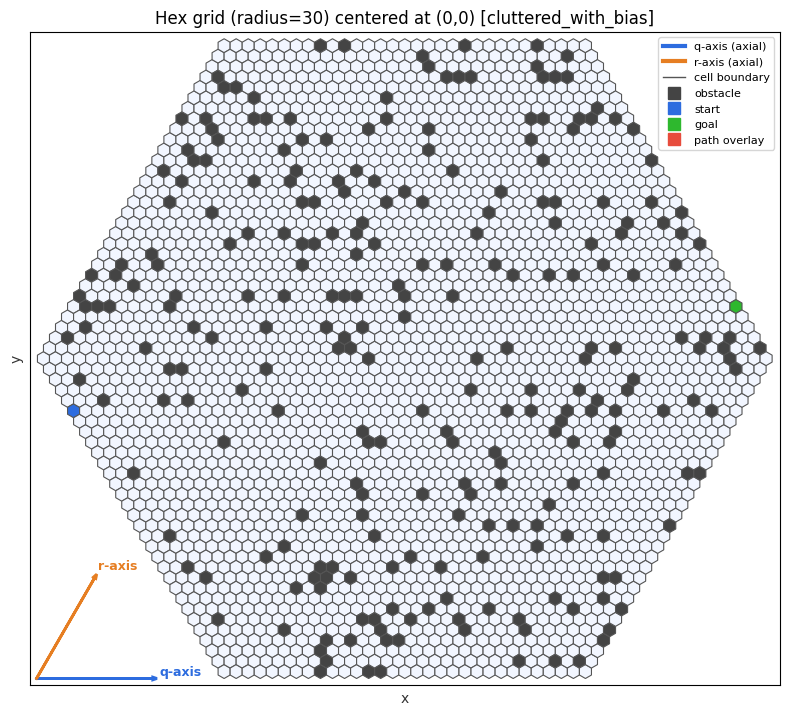

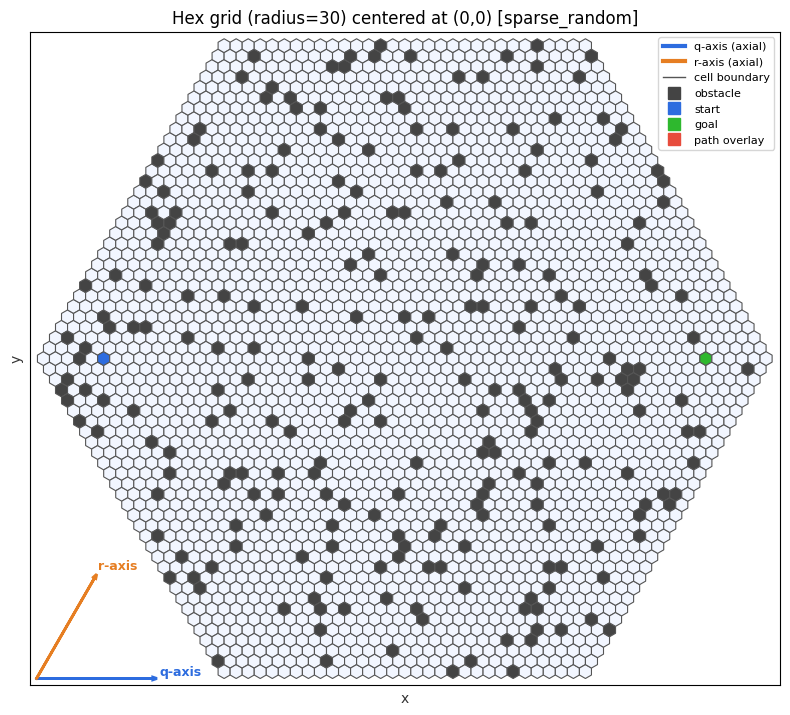

...

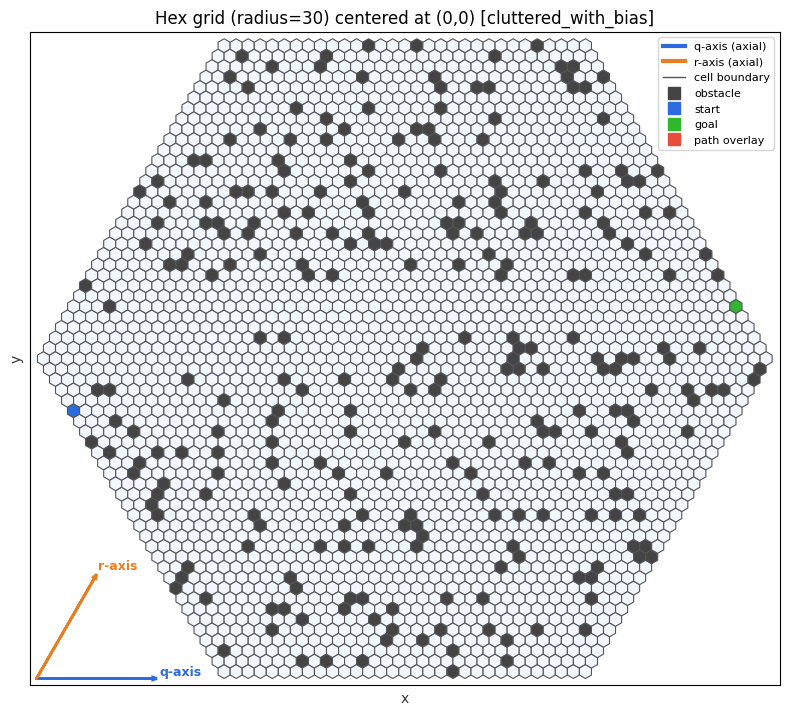

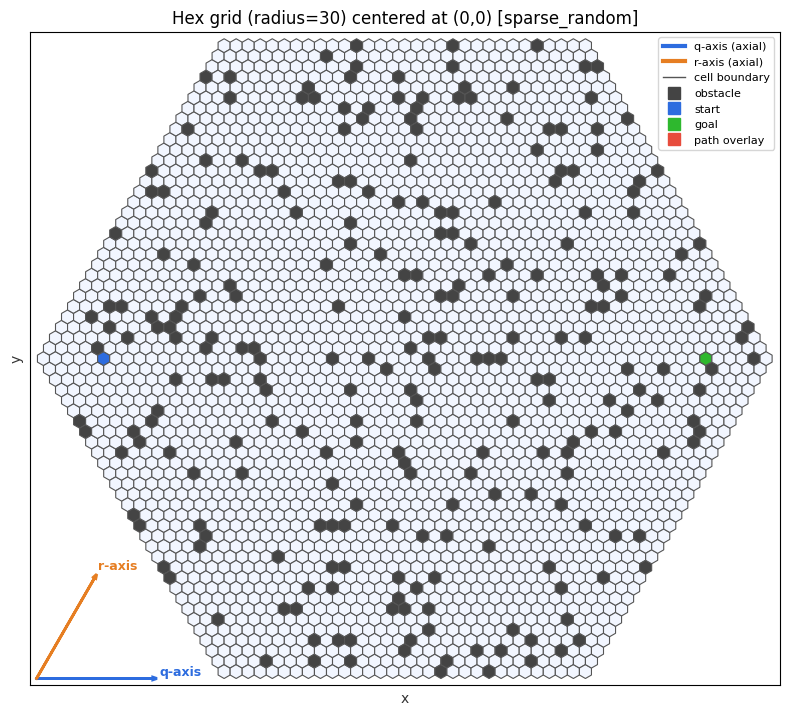

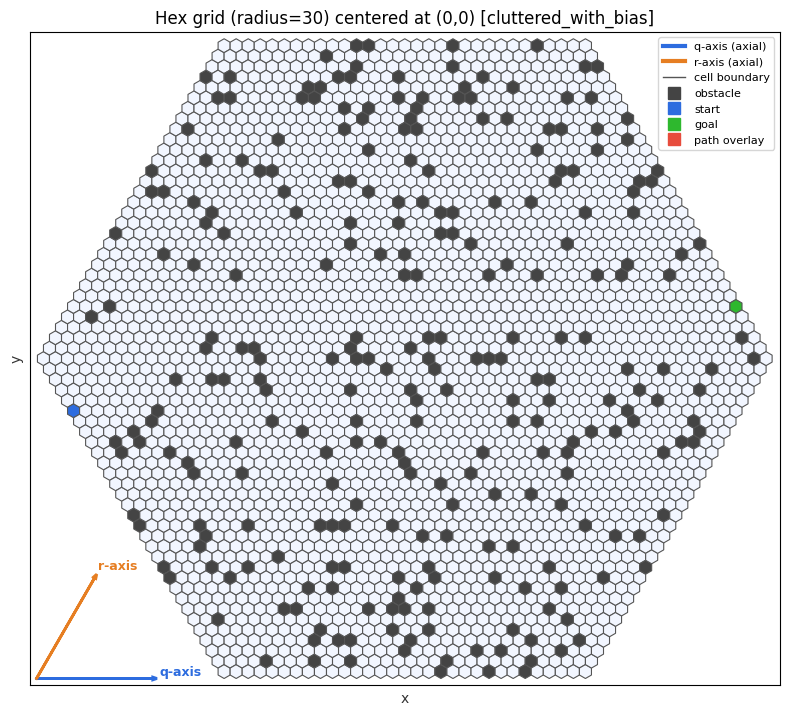

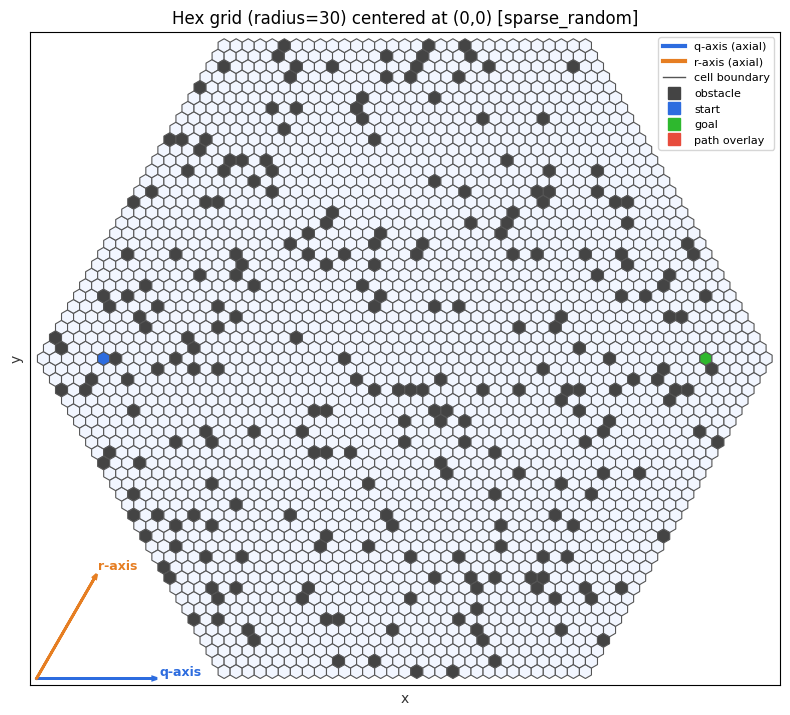

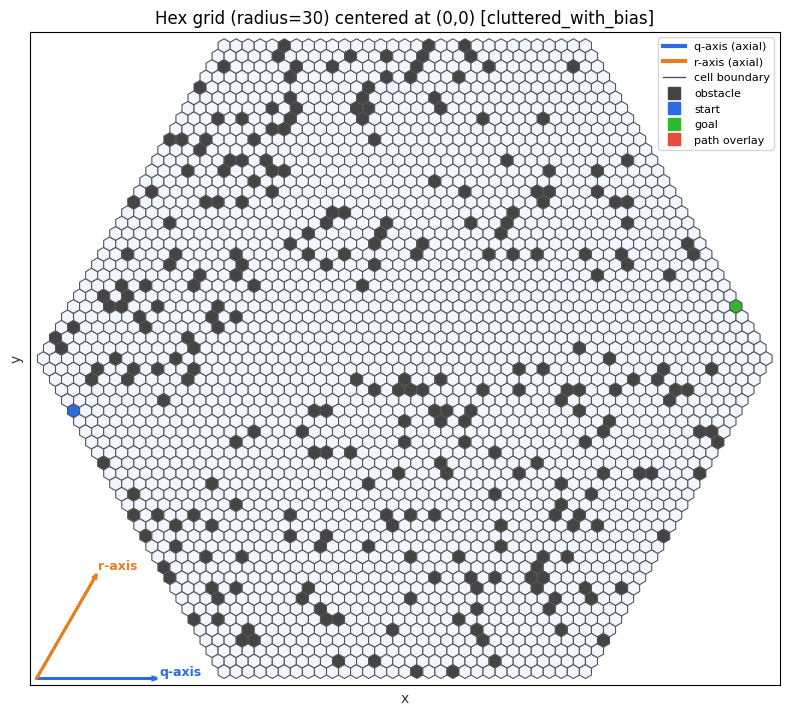

In [109]:
for c in scenarios:
    plot_map_config(c, hex_size=problem.grid.hex_size)

{'name': 'sparse_random', 'center': HexCoord(q=0, r=0), 'radius': 30, 'start': HexCoord(q=-25, r=0), 'goal': HexCoord(q=25, r=0), 'types': [('random_n', {'n': 250}, 'add')], 'seed': 9}
{'name': 'cluttered_with_bias', 'center': HexCoord(q=0, r=0), 'radius': 30, 'start': HexCoord(q=-25, r=-5), 'goal': HexCoord(q=25, r=5), 'types': [('random_n', {'n': 300}, 'add'), ('track', {'start': HexCoord(q=-25, r=-5), 'goal': HexCoord(q=25, r=5), 'thickness': 2, 'min_turns': 4}, 'carve')], 'seed': 9}
H* {'length': {'mean': 94.54998149518622, 'min': 89.81793068761733, 'max': 99.28203230275508}, 'turn_per_length': {'mean': 0.016655114452835754, 'min': 0.015821556935950297, 'max': 0.017488671969721214}, 'curv_per_length': {'mean': 0.001421382909913746, 'min': 0.0007830726035265331, 'max': 0.002059693216300959}, 'curv_sq_per_length': {'mean': 0.00014615789633906745, 'min': 2.1659461953446653e-05, 'max': 0.00027065633072468823}, 'max_curvature': {'mean': 0.09881554191797735, 'min': 0.037502930030867465, 

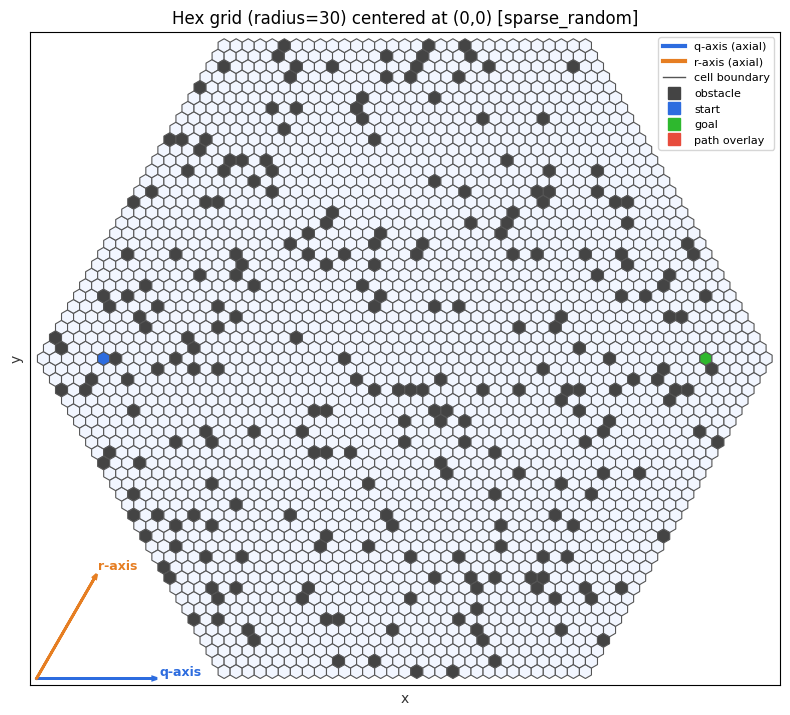

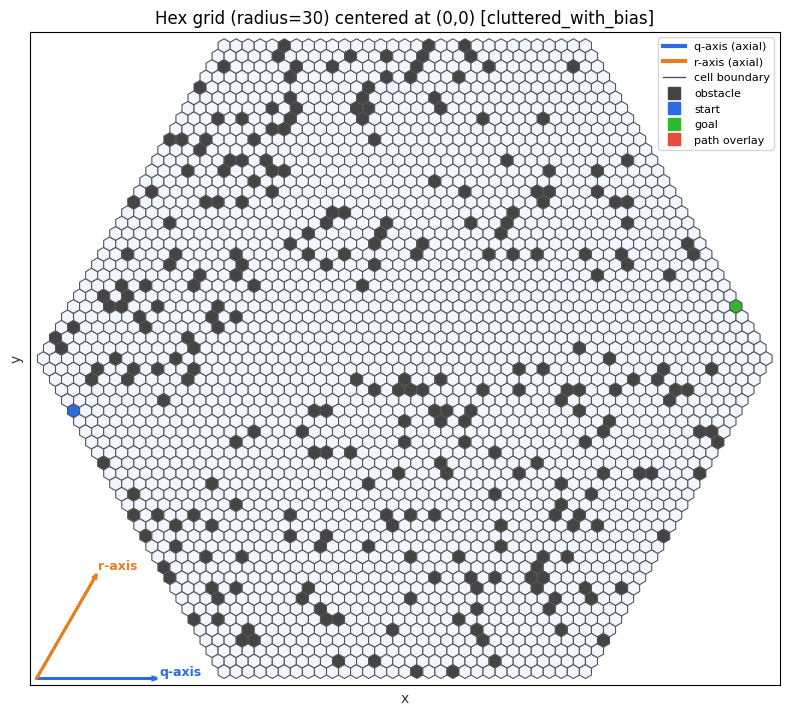

In [115]:
res_hstar = run_benchmark(scenarios, num_runs=1)

print("H*", summarize(res_hstar))

In [48]:
res_hstar

[]